#### loading in various libraries

In [1]:
%matplotlib inline
import matplotlib
print('matplotlib version:', matplotlib.__version__)
import matplotlib.pyplot as plt
from matplotlib_venn import venn3
from matplotlib_venn import venn2
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

import os
import glob
import re
import itertools
from collections import Counter
import math

import numpy as np
print('numpy version', np.__version__)
from numpy import median

import pandas as pd
print('pandas version:', pd.__version__)
from pandas import ExcelWriter
from pandas import ExcelFile

import seaborn as sns
print('seaborn version:', sns.__version__)
cmap = sns.cm.rocket_r
sns.set_style("white")

import scipy as sci
import scipy.sparse
print('scipy version:', sci.__version__)
from scipy import spatial
from scipy.stats import(kstest, poisson)

import scanpy as sc
sc.logging.print_version_and_date()
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

import anndata
print('anndata version:', anndata.__version__)
from anndata import read_h5ad
from anndata import AnnData

import scvelo as scv
scv.logging.print_version()
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params('scvelo')  # for beautified visualization

from functools import reduce


matplotlib version: 3.3.0
numpy version 1.18.5
pandas version: 1.0.3
seaborn version: 0.11.1
scipy version: 1.5.0
Running Scanpy 1.5.1, on 2021-07-08 12:20.
anndata version: 0.7.3
Running scvelo 0.2.1 (python 3.6.10) on 2021-07-08 12:20.


#### Specifying paths to directories where the datasets are held and saved to (switch out for your own paths)

In [ ]:
mainDir = '/oak/stanford/groups/quake/gita/raw/tab2_20200508/cellCycle/'
mainDir2 = '/oak/stanford/groups/quake/gita/raw/tab2_20200508/'


#### reading in the object containing all donors


In [ ]:
alldons = sc.read_h5ad('/oak/stanford/groups/quake/gita/raw/tab2_20200508/objects/tSP1_TSP15_scvi_donor-method_normalized-log1p-scaled_annotated.h5ad')

####  making predictions about cell cycle state by first designating cell cycle marker genes to each phase of the cell cycle, and then defining two main cell cycle states (i.e. cycling and non-cycling). 


In [12]:
col = 'cell_ontology_class'

#S markers
lst_sub_1 = ['ABHD10','CCDC14','CDKN2AIP','NT5DC1','SVIP','PTAR1']
#G2M markers
lst_sub_2 = ['SMC4','TMPO','LMNB1','HINT3']
#M markers
lst_sub_3 = ['HMG20B','HMGB3','HPS4']
#G2 markers
lst_sub_4 = ['ANKRD36C','YEATS4','DCTPP1']
#G1S marker
lst_sub_5 = ['CEP57','CDCA7L']
#G0 marker
lst_sub_6 = ['CDKN1A','CDKN1B','CDKN1C']


final_lst = lst_sub_1 + lst_sub_2 + lst_sub_3 + lst_sub_4 + lst_sub_5 + lst_sub_6
cycling = lst_sub_1 + lst_sub_2 + lst_sub_3 + lst_sub_4 + lst_sub_5 
sc.tl.score_genes(alldons, cycling, score_name = 'cycling', use_raw=False)
sc.tl.score_genes(alldons, lst_sub_6, score_name = 'non-cycling',use_raw=False)

def scoring(cycling, non_cycling):
    if cycling == non_cycling:
        decision = 'not clear'
    elif cycling > non_cycling:
        decision = 'cycling'
    else:   
        decision = 'non-cycling'
    return(decision)


#same as above but for total dataset
alldons.obs['decision']= alldons.obs.apply(lambda row: scoring(row['cycling'], row['non-cycling']), axis=1)
#collecting only cells for which a decision could be made
dataCyc10=alldons[alldons.obs['decision']!='not clear']
print('fraction of cells with clear calls:', dataCyc10.shape[0]/alldons.shape[0])
# alldons.var.rename(columns={'gene_symbol-0-0-1': 'geneName'}, inplace=True)


computing score 'cycling'
    finished: added
    'cycling', score of gene set (adata.obs).
    199 total control genes are used. (0:00:21)
computing score 'non-cycling'
    finished: added
    'non-cycling', score of gene set (adata.obs).
    100 total control genes are used. (0:00:16)
fraction of cells with clear calls: 0.9999801542412371


#### saving the object with the cell cycle predictions

In [22]:
alldons.write('/oak/stanford/groups/quake/gita/raw/tab2_20200508/objects/tSP1_TSP15_scvi_donor-method_normalized-log1p-scaled_annotated_withCellcycle.h5ad')

... storing 'decision' as categorical


####  reading in object containing cell cycle predictions

In [2]:
alldons = sc.read_h5ad(mainDir2 + 'objects/tSP1_TSP15_scvi_donor-method_normalized-log1p-scaled_annotated_withCellcycle.h5ad')

In [3]:
column='cell_ontology_class'
#filtering low-quality cells types and predictions that are not clear
alldons = alldons[~(alldons.obs[column].str.contains('doublet|low quality|erythrocyte', case=False)) &
                        (alldons.obs['decision']!='not clear')]
#getting cell compartment information
comps=pd.read_csv(mainDir2 + 'notebooks/compartments.csv',  delimiter ='\t')

#want a column that has both cell type and tissue information
alldons.obs['celltissue'] = alldons.obs[column].astype(str) + '_' + alldons.obs['tissue'].astype(str)

alldons_df = alldons.obs
alldons_df = alldons_df.merge(comps, on='cell_ontology_class', how='inner')

#### setting the color map for each donor

In [7]:
ccode=['#034001',
'#8FBC8F',
'#c5ba30',
'#DC143C',
'#FFD700',
'#8839ff',
'#c34a17',
'orange',
'#f507a0',
'#9CADCA',
'#27BFD2',
'#bc7c00',
'#4169E1',
'#636c8c',
'#ADD8E6']

don_lst = ['TSP6', 'TSP7', 'TSP4', 'TSP5', 'TSP10', 'TSP8', 'TSP3', 'TSP11', 'TSP12', 'TSP9','TSP14', 'TSP15', 'TSP1', 'TSP2','TSP13']

donor_colormap = dict(zip(don_lst, ccode))
print(donor_colormap)

{'TSP6': '#034001', 'TSP7': '#8FBC8F', 'TSP4': '#c5ba30', 'TSP5': '#DC143C', 'TSP10': '#FFD700', 'TSP8': '#8839ff', 'TSP3': '#c34a17', 'TSP11': 'orange', 'TSP12': '#f507a0', 'TSP9': '#9CADCA', 'TSP14': '#27BFD2', 'TSP15': '#bc7c00', 'TSP1': '#4169E1', 'TSP2': '#636c8c', 'TSP13': '#ADD8E6'}


#### plotting the cell cycle indices across different cellt ypes, tissues, and donors

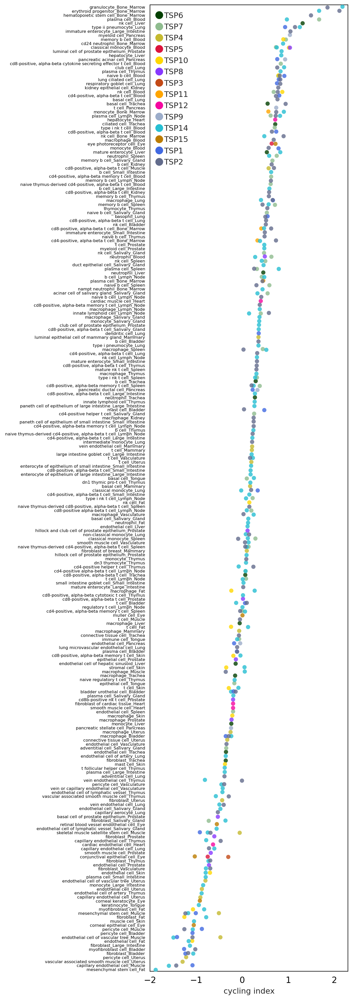

In [8]:
column2='celltissue'
dfs_trio=[]
don_lst = alldons.obs.donor.unique().tolist()
don_lst.remove('TSP13')

for donor in don_lst:
    #donor 13 doesn't have enough cells for this analysis
    if donor != 'TSP13':
        dataCyc10_tsp1 = alldons[(alldons.obs['donor']==donor)]

        grouped_tsp1=dataCyc10_tsp1.obs.groupby([column2]).count()
        

        grouped2_tsp1 = grouped_tsp1[grouped_tsp1['decision']>=200]

        #list of cell types that pass the filters
        grouped2list_tsp1=grouped2_tsp1.index.tolist() 

        #reducing dataCyc10 by cell types that have 200 observations (inlcuded in grouped3list)
        dataCyc10_fil_tsp1 = dataCyc10_tsp1[dataCyc10_tsp1.obs[column2].isin(grouped2list_tsp1)]

        dataCyc10_fil_df_tsp1=dataCyc10_fil_tsp1.obs.groupby([column2, 'decision']).count().unstack()['cycling']

        #ratio of cycling to non-cycling cells
        cells_tsp1=dataCyc10_fil_df_tsp1.index.tolist()

        dataCyc10_fil_df_tsp1 = pd.DataFrame({'cycling': dataCyc10_fil_df_tsp1['cycling'].tolist(),
                               'non-cycling': dataCyc10_fil_df_tsp1['non-cycling'].tolist()})

        dataCyc10_fil_df_tsp1['ratio_'+donor]=dataCyc10_fil_df_tsp1['cycling']/dataCyc10_fil_df_tsp1['non-cycling']

        dataCyc10_fil_df_tsp1.index = cells_tsp1

        dataCyc10_fil_df_tsp1.index.name  = column2

        #sorting the ratios (ratio of cycling to non)
        dataCyc10_fil_sorted_df_tsp1 = np.log10(dataCyc10_fil_df_tsp1)

        dataCyc10_fil_sorted_df_tsp1 = dataCyc10_fil_sorted_df_tsp1.reset_index()
        dataCyc10_fil_sorted_df_tsp1['donor_'+donor]=dataCyc10_fil_sorted_df_tsp1.shape[0]*[donor]

        dfs_trio.append(dataCyc10_fil_sorted_df_tsp1)


tsp = reduce(lambda left,right: pd.merge(left,right,on=column2, how='outer'), dfs_trio)
cols=[x for x in tsp.columns if 'ratio_TSP' in x]
tsp['mean'] = tsp[cols].mean(axis=1)
tsp=tsp.sort_values(by='mean', ascending=False)

#plotting figure and legned
plt.figure(figsize=[5,25])
legend =[]
for index,donor in enumerate(don_lst):
    ax = sns.stripplot(x=tsp['ratio_'+donor], y=tsp[column2], order=tsp[column2], size=6,color=ccode[index], alpha=.8)
    plt.xlabel('cycling index')

    plt.ylabel('')
    plt.xlim(-2,2.3)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=6)
    
    legend.append(Line2D([0], [0], marker='o', color=ccode[index], label=donor,
                          markerfacecolor=ccode[index], markersize=10))
plt.legend(handles=legend, loc='upper left', frameon=False)

#saving the figure
plt.savefig(mainDir + 'images/cell_cycle_index_all_donors_v2_06_26_2021.pdf', bbox_inches='tight')

#### saving cell cycle indices to an excel sheet

In [11]:
df=tsp[['celltissue', 'mean']]
df.rename(columns={'mean':'average_cell_cycle_index'}, inplace=True)
df.to_excel(mainDir + 'cell_cycle_index_v2.xlsx')

In [2]:
totalVelo = sc.read_h5ad(mainDir2 + 'objects/totalVelo_withCellCycleScores_mitoUnfiltered_Dec2020.h5ad')

#### Bladder mesenchymal to myofibroblast differentiation in TSP1

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)


... storing 'decision' as categorical
... storing 'decision2' as categorical


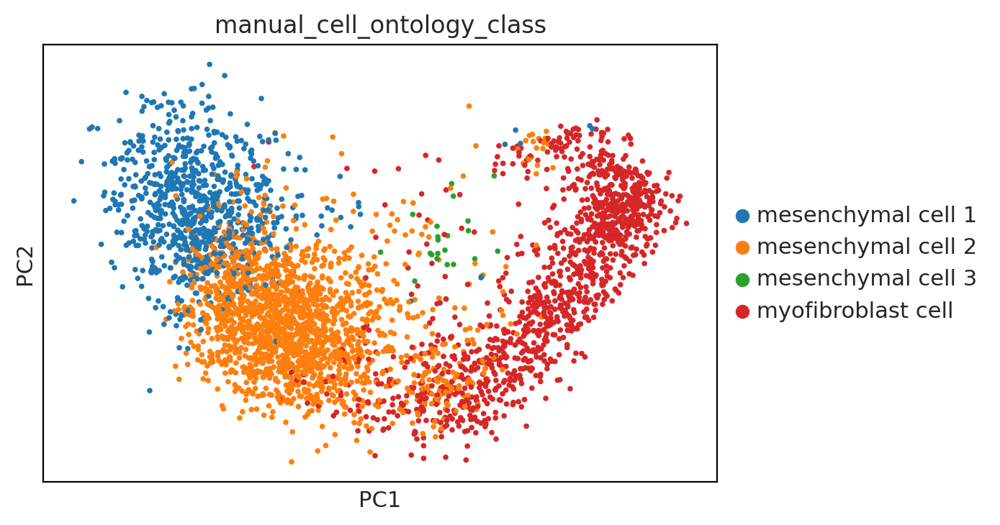

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:15)


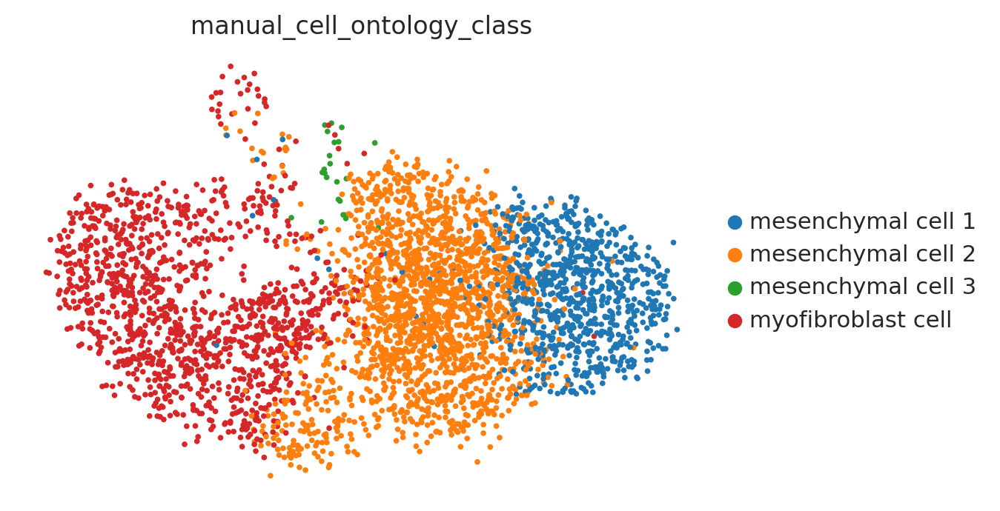

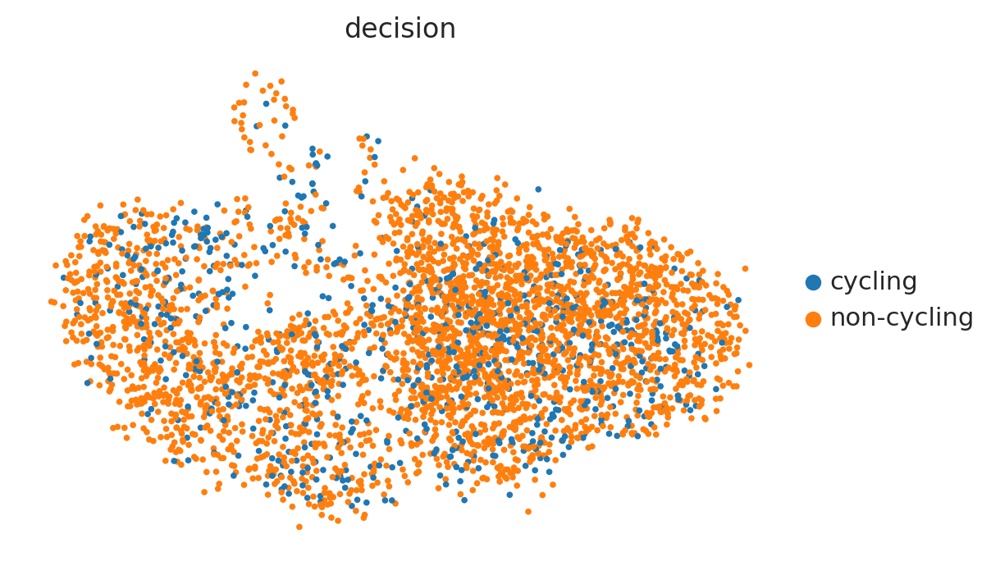

computing moments based on connectivities
    finished (0:01:55) --> added 
    'Ms' and 'Mu', moments of spliced/unspliced abundances (adata.layers)
recovering dynamics
... 12%WARNING: SRD5A2 not recoverable due to insufficient samples.
... 19%WARNING: SLC6A20 not recoverable due to insufficient samples.
... 48%WARNING: skipping bimodality check for XKR4
... 50%WARNING: RHPN1-AS1 not recoverable due to insufficient samples.
... 77%WARNING: AURKB not recoverable due to insufficient samples.
... 93%WARNING: RIPK4 not recoverable due to insufficient samples.
    finished (0:10:47) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:04) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:13) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:01) --> added
    'velocity

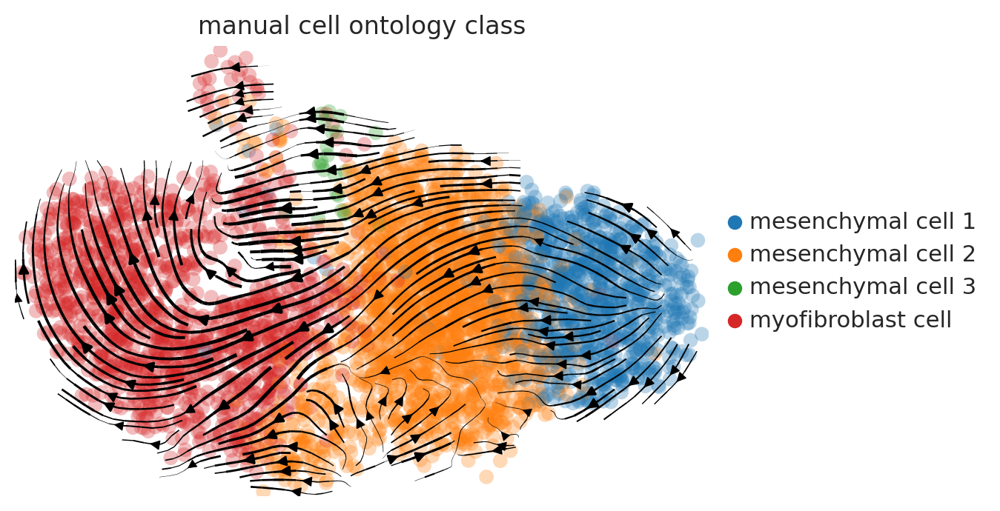

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


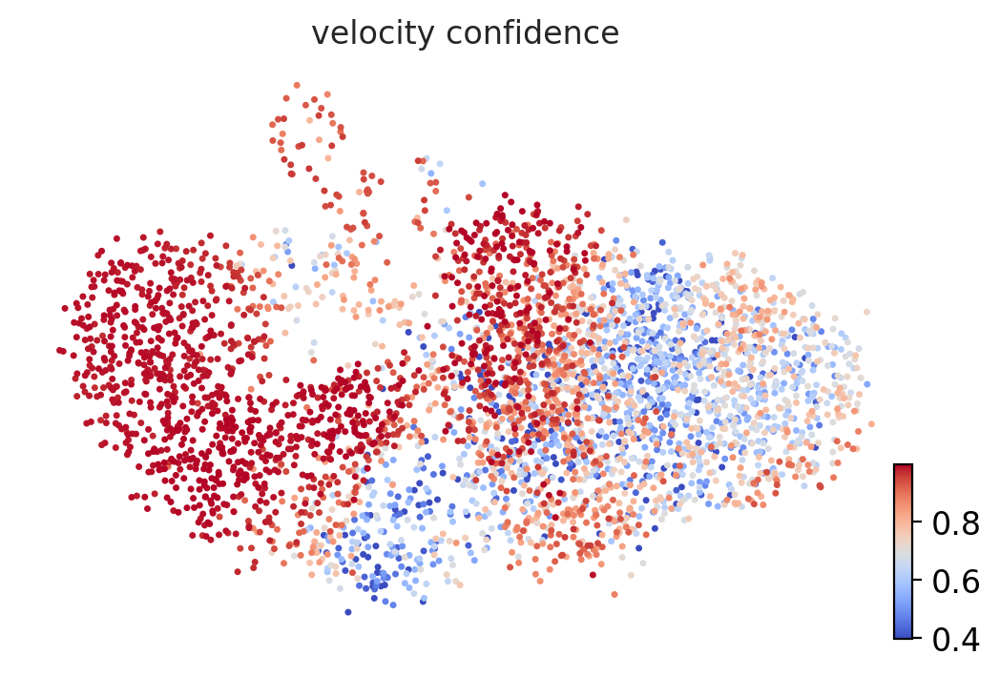

ranking velocity genes
    finished (0:00:01) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


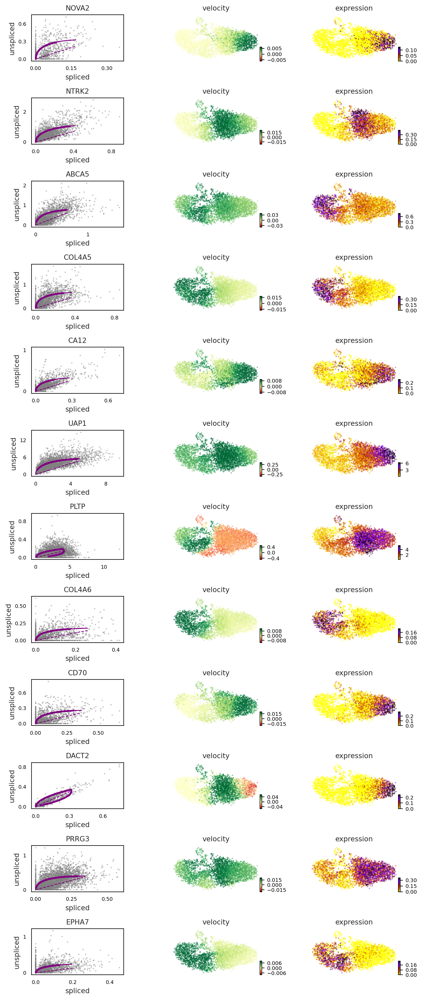

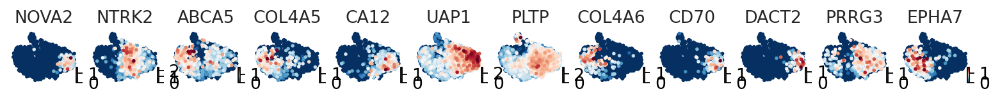

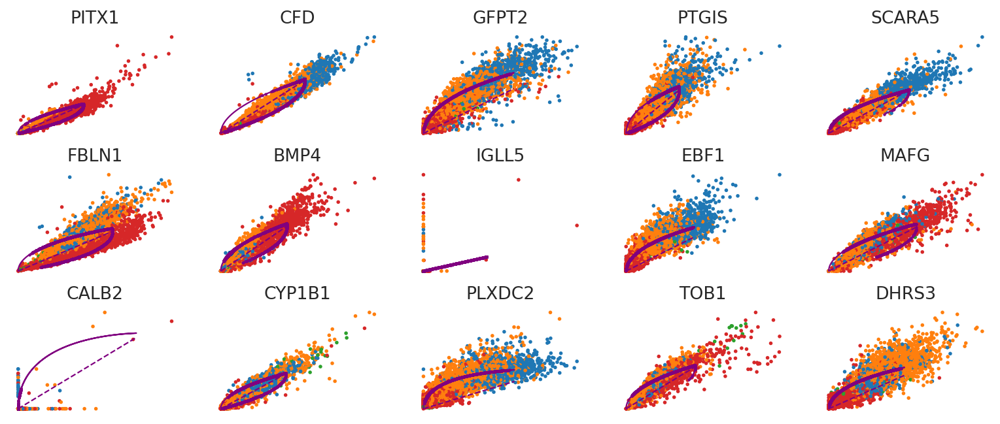

computing terminal states
    identified 2 regions of root cells and 1 region of end points 
    finished (0:00:01) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:01) --> added 
    'latent_time', shared time (adata.obs)


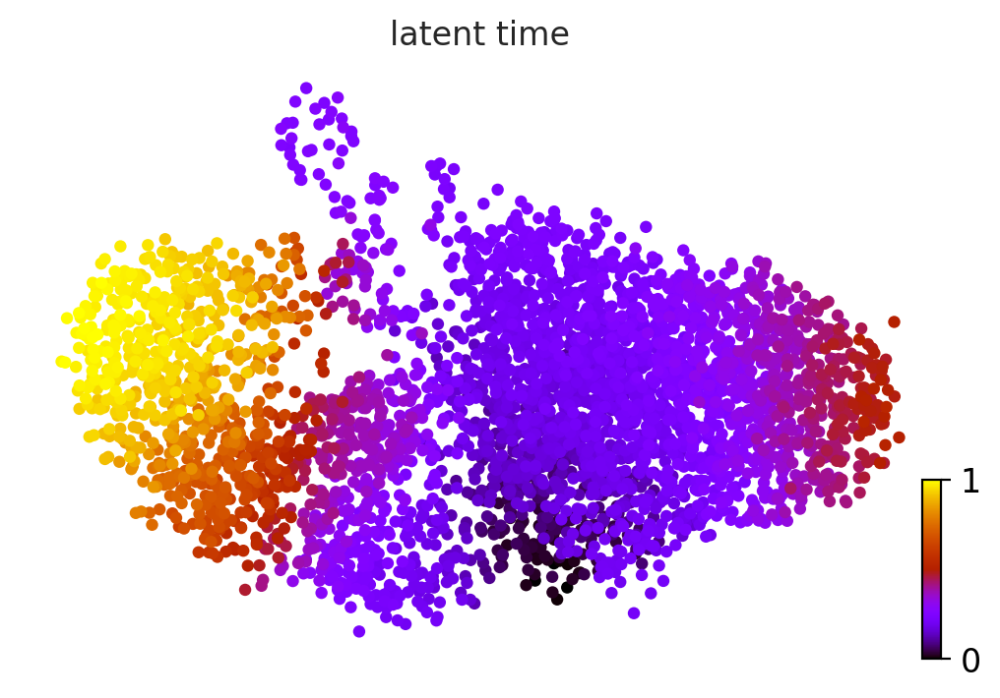

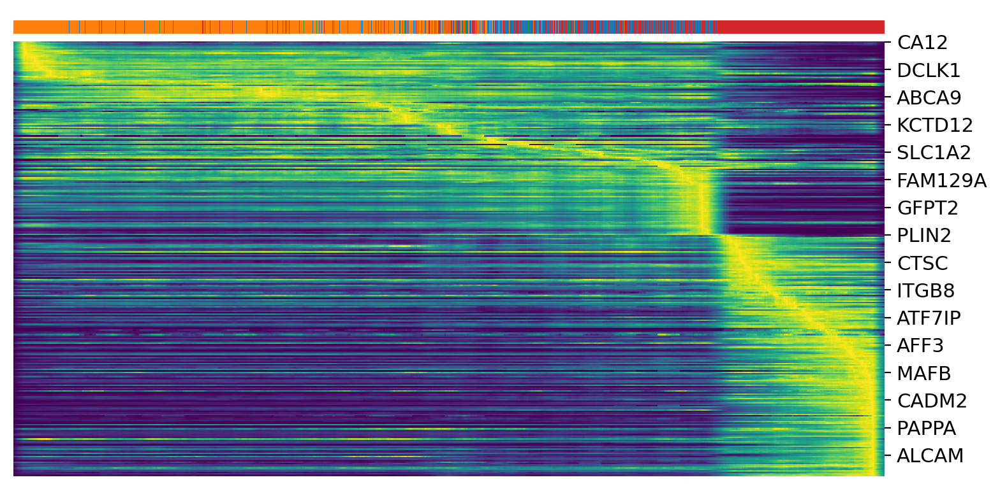

Now ranking dynamical genes grouped by cell type
ranking genes by cluster-specific likelihoods
    finished (0:00:02) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)


,mesenchymal cell 1,mesenchymal cell 2,mesenchymal cell 3,myofibroblast cell
0,MAFG,CFD,GULP1,CFD
1,CYP1B1,GFPT2,MARCH3,FBLN1
2,TOB1,SCARA5,RASL11B,SLIT2
3,DHRS3,MAFG,DHRS3,DACH1
4,FBLN1,EBF1,TWIST1,EDIL3


In [44]:
#getting the portion of the object that belongs to TSP1 bladder and contains the specified cell types
endo=totalVelo[(totalVelo.obs['donor']=='TSP1') & (totalVelo.obs['tissue']=='Bladder') & 
               (totalVelo.obs['manual_cell_ontology_class'].str.contains(
                   'fibroblast|myofibroblast|mesenchymal cell'))].copy()

#standard pre-processing and embeddings
scv.pp.filter_genes_dispersion(endo, n_top_genes=2000)
sc.tl.pca(endo, svd_solver='arpack')
sc.pp.neighbors(endo,n_neighbors=80)

sc.pl.pca(endo, color='manual_cell_ontology_class')
sc.tl.umap(endo,spread=.18)
sc.pl.umap(endo, color='manual_cell_ontology_class',frameon=False)
sc.pl.umap(endo, color='decision',frameon=False)

#RNA velocity moments and embeddings
scv.pp.moments(totalVelo, n_pcs=30, n_neighbors=15, use_rep="X_scvi_decontX")
#depending on whether the model is steady-state or dynamic
scv.tl.recover_dynamics(endo)
scv.tl.velocity(endo, mode='dynamical')
scv.tl.velocity_graph(endo)
scv.pl.velocity_embedding_stream(endo, basis='umap', color ='manual_cell_ontology_class', legend_loc='right')
scv.tl.velocity_confidence(endo)
scv.pl.scatter(endo, color='velocity_confidence', cmap='coolwarm', perc=[5, 95])
scv.tl.rank_velocity_genes(endo, groupby='manual_cell_ontology_class', min_corr=.3)

#important genes
df = scv.DataFrame(endo.uns['rank_velocity_genes']['names'])
important=df.iloc[0,:].tolist()
important = important + df.iloc[1,:].tolist() + df.iloc[2,:].tolist()
scv.pl.velocity(endo, important)

scv.pl.umap(endo, color=important, use_raw=False)
top_genes = endo.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(endo, basis=top_genes[:15], ncols=5, frameon=False, color='manual_cell_ontology_class')

scv.tl.latent_time(endo)
scv.pl.scatter(endo, color='latent_time', color_map='gnuplot', size=80)


top_genes = endo.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(endo, var_names=top_genes, sortby='latent_time', col_color='manual_cell_ontology_class', n_convolve=100)

print('Now ranking dynamical genes grouped by cell type')

scv.tl.rank_dynamical_genes(endo, groupby='manual_cell_ontology_class')
df = scv.get_df(endo, 'rank_dynamical_genes/names')
df.head(5)


# endo.write(mainDir2 + 'tsp1_bladder_mesenchymeToMyofibroblast_mitoUnfiltered_Dec2020.h5ad', compression='gzip')

#### Bladder mesenchymal to myofibroblast differentiation in TSP2 

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


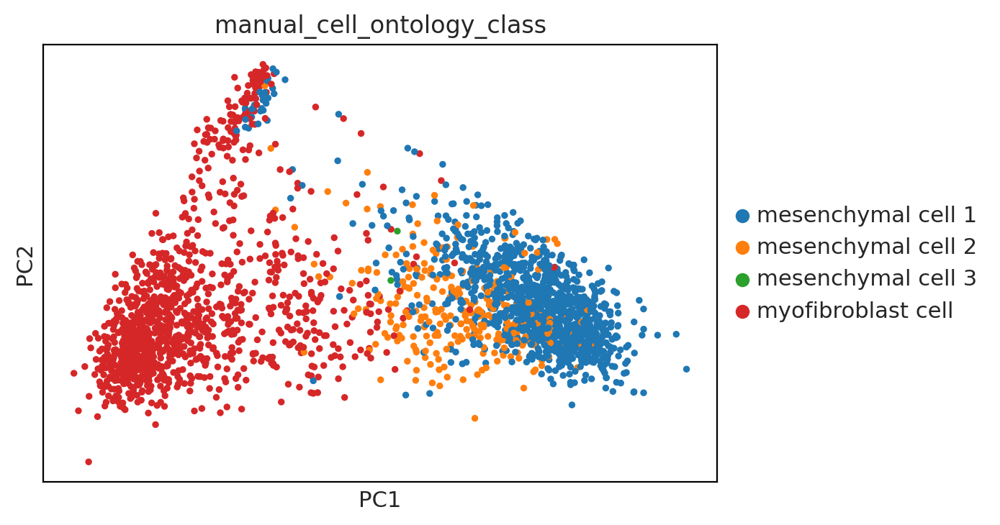

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


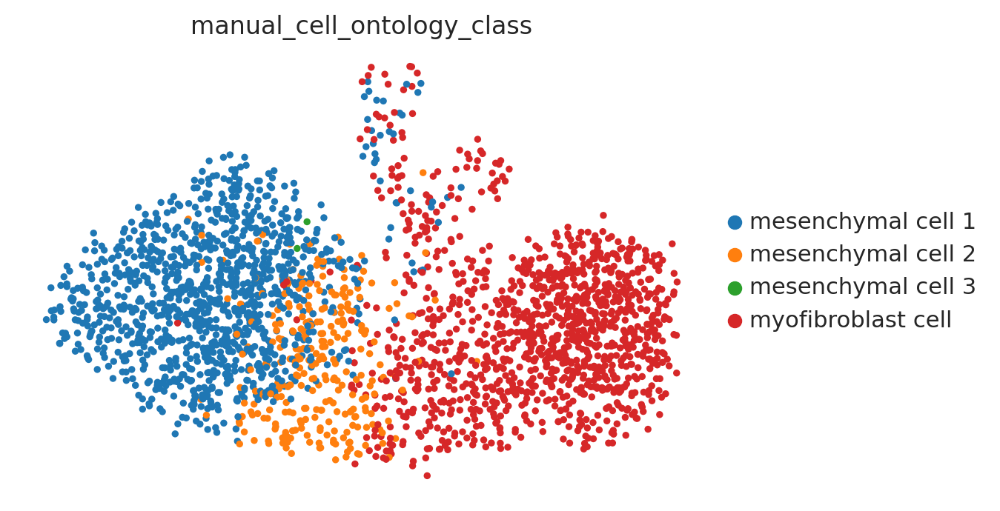

computing moments based on connectivities
    finished (0:01:47) --> added 
    'Ms' and 'Mu', moments of spliced/unspliced abundances (adata.layers)
recovering dynamics
... 49%WARNING: skipping bimodality check for AC108860.2
... 90%WARNING: AC243960.1 not recoverable due to insufficient samples.
    finished (0:10:28) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:02) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:10) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


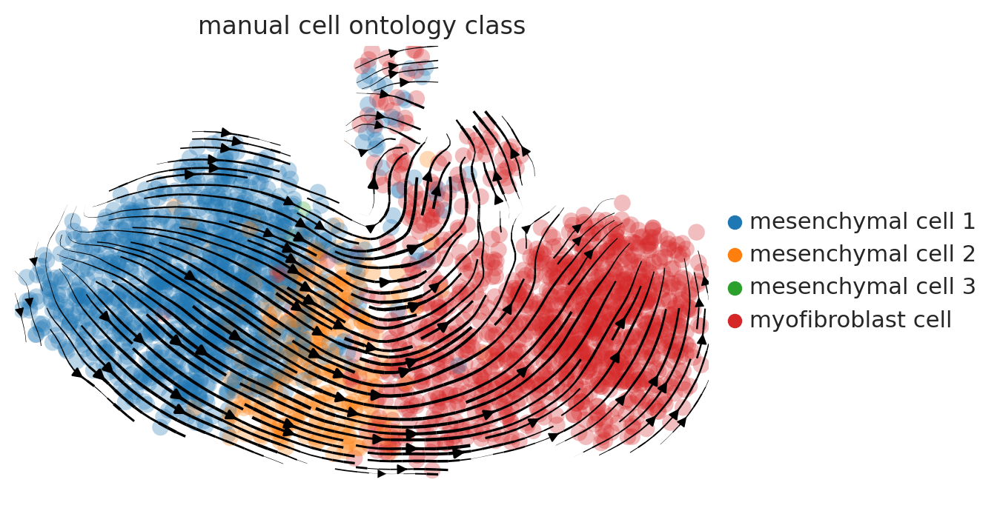

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


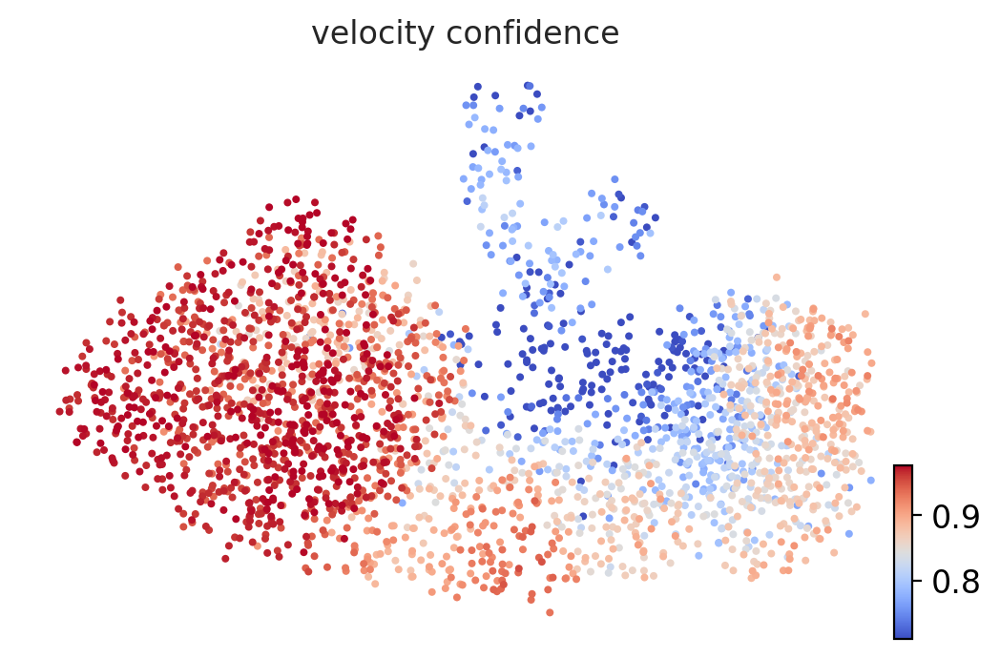

ranking velocity genes
    finished (0:00:01) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


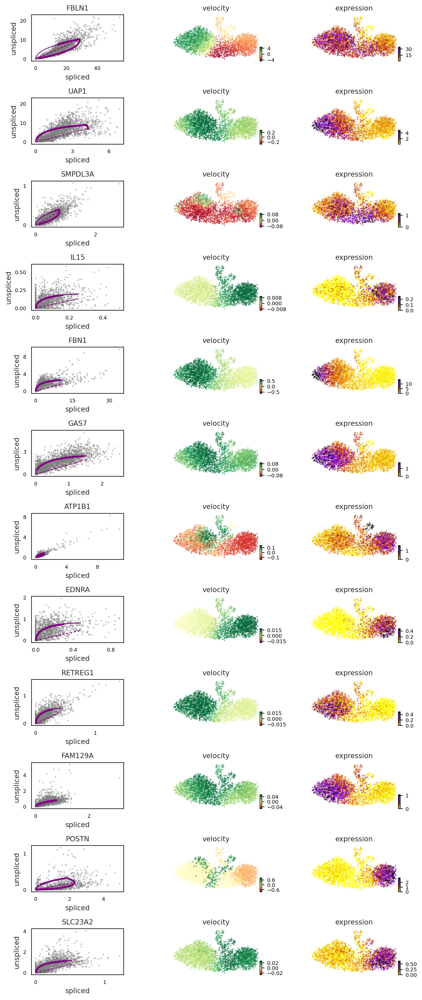

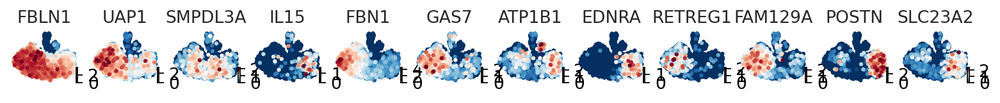

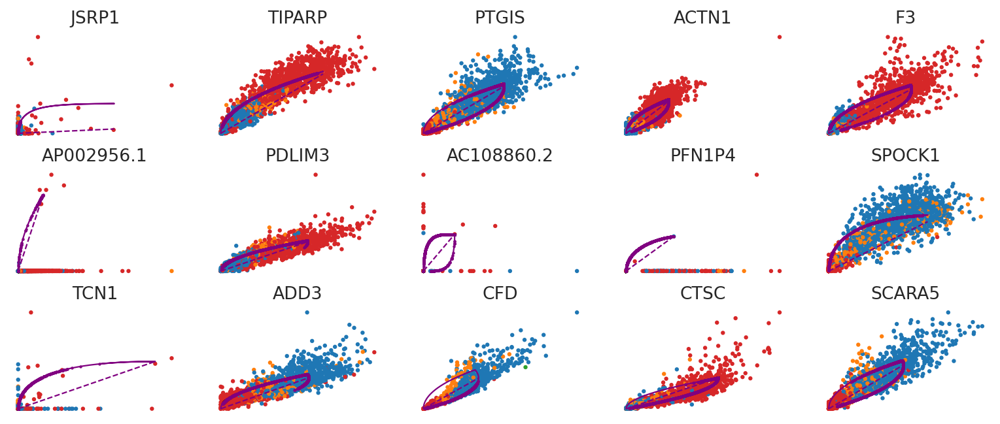

computing terminal states
    identified 1 region of root cells and 1 region of end points 
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


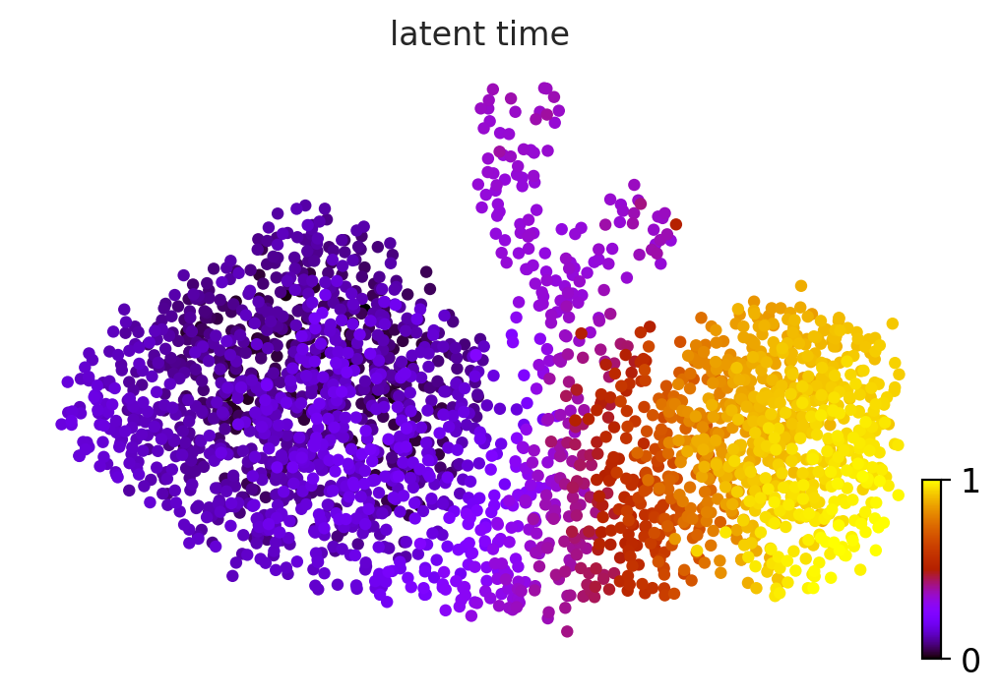

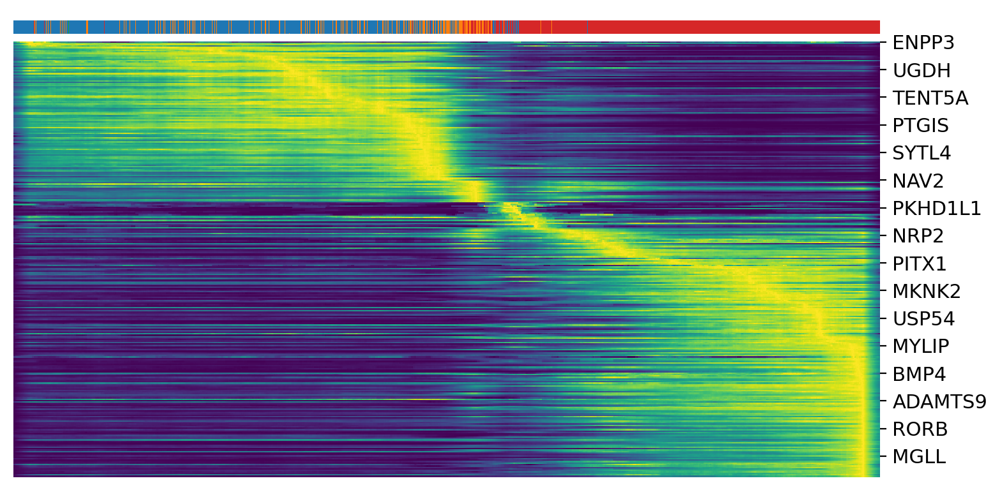

Now ranking dynamical genes grouped by cell type
ranking genes by cluster-specific likelihoods
    finished (0:00:02) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)


In [27]:
endo=totalVelo[(totalVelo.obs['donor']=='TSP2') & (totalVelo.obs['tissue']=='Bladder') & 
               (totalVelo.obs['manual_cell_ontology_class'].str.contains(
                   'myofibroblast|mesenchymal cell'))].copy()

scv.pp.filter_genes_dispersion(endo, n_top_genes=2000)

sc.tl.pca(endo, svd_solver='arpack')
sc.pp.neighbors(endo,n_neighbors=100)

sc.pl.pca(endo, color='manual_cell_ontology_class')
sc.tl.umap(endo,spread=.18)
sc.pl.umap(endo, color='manual_cell_ontology_class',frameon=False)
scv.pp.moments(totalVelo, n_pcs=30, n_neighbors=15, use_rep="X_scvi_decontX")
#depending on whether the model is steady-state or dynamic
scv.tl.recover_dynamics(endo)
scv.tl.velocity(endo, mode='dynamical')
scv.tl.velocity_graph(endo)
scv.pl.velocity_embedding_stream(endo, basis='umap', color ='manual_cell_ontology_class', legend_loc='right')



scv.tl.velocity_confidence(endo)
scv.pl.scatter(endo, color='velocity_confidence', cmap='coolwarm', perc=[5, 95])

scv.tl.rank_velocity_genes(endo, groupby='manual_cell_ontology_class', min_corr=.3)

#important genes
df = scv.DataFrame(endo.uns['rank_velocity_genes']['names'])
important=df.iloc[0,:].tolist()
important = important + df.iloc[1,:].tolist() + df.iloc[2,:].tolist()
scv.pl.velocity(endo, important)

scv.pl.umap(endo, color=important, use_raw=False)
top_genes = endo.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(endo, basis=top_genes[:15], ncols=5, frameon=False, color='manual_cell_ontology_class')

scv.tl.latent_time(endo)
scv.pl.scatter(endo, color='latent_time', color_map='gnuplot', size=80)


top_genes = endo.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(endo, var_names=top_genes, sortby='latent_time', col_color='manual_cell_ontology_class', n_convolve=100)

print('Now ranking dynamical genes grouped by cell type')

scv.tl.rank_dynamical_genes(endo, groupby='manual_cell_ontology_class')
df = scv.get_df(endo, 'rank_dynamical_genes/names')
df.head(5)

# for cluster in lst:
#     scv.pl.scatter(endo, df[cluster][:5], ylabel=cluster, frameon=False, color = 'manual_cell_ontology_class')

endo.write(mainDir2 + 'tsp2_bladder_mesenchymeToMyofibroblast_mitoUnfiltered_Dec2020.h5ad', compression='gzip')


#### visualizing various genes as a function of latent time 

In [87]:
tsp1Myo=sc.read_h5ad(mainDir2 + 'objects/tsp1_bladder_mesenchymeToMyofibroblast_mitoUnfiltered_Dec2020.h5ad')
tsp2Myo=sc.read_h5ad(mainDir2 + 'objects/tsp2_bladder_mesenchymeToMyofibroblast_mitoUnfiltered_Dec2020.h5ad')


In [88]:
#two groups of cells for easier viewing: mesenchymal and myofibroblast
tsp2Myo.obs['manual_cell_ontology_class'].replace('mesenchymal cell 1', 'mesenchymal cell', inplace=True)
tsp2Myo.obs['manual_cell_ontology_class'].replace('mesenchymal cell 2', 'mesenchymal cell', inplace=True)
tsp2Myo.obs['manual_cell_ontology_class'].replace('mesenchymal cell 3', 'mesenchymal cell', inplace=True)

tsp1Myo.obs['manual_cell_ontology_class'].replace('mesenchymal cell 1', 'mesenchymal cell', inplace=True)
tsp1Myo.obs['manual_cell_ontology_class'].replace('mesenchymal cell 2', 'mesenchymal cell', inplace=True)
tsp1Myo.obs['manual_cell_ontology_class'].replace('mesenchymal cell 3', 'mesenchymal cell', inplace=True)

In [89]:
top_genes_tsp1 = tsp1Myo.var['fit_likelihood'].sort_values(ascending=False).index[:300]
top_genes_tsp2 = tsp2Myo.var['fit_likelihood'].sort_values(ascending=False).index[:300]

genes_tsp1 = top_genes_tsp1.to_frame().rename(columns={'index':'gene'})
genes_tsp2 = top_genes_tsp2.to_frame().rename(columns={'index':'gene'})

#merging the genes from tsp1 and tsp2 to look at the ones they share in common
genes12=genes_tsp1.merge(genes_tsp2, how ='inner', on ='gene')

saving figure to file ./figures/scvelo_tsp1_row1.pdf


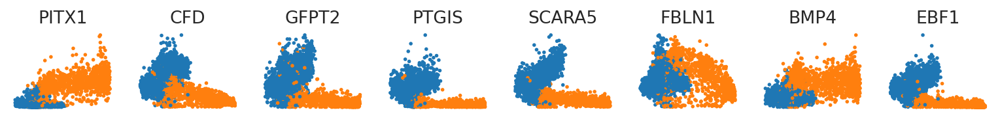

saving figure to file ./figures/scvelo_tsp2_row1.pdf


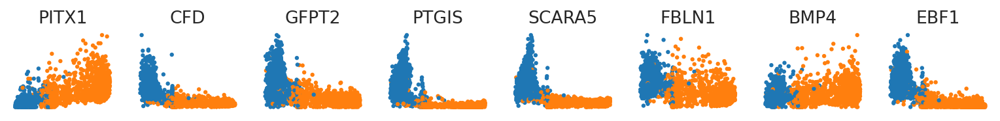

saving figure to file ./figures/scvelo_tsp1_row2.pdf


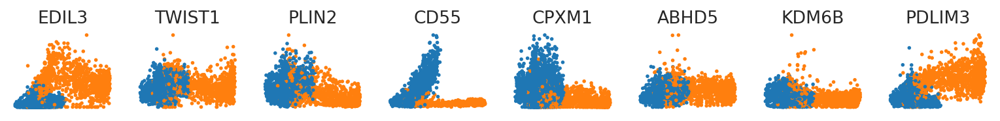

saving figure to file ./figures/scvelo_tsp2_row2.pdf


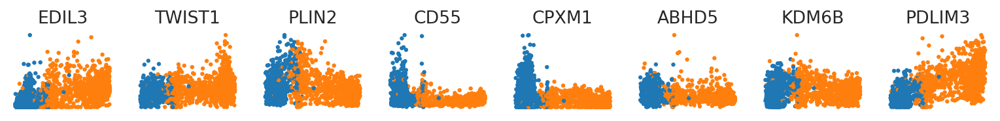

saving figure to file ./figures/scvelo_tsp1_row3.pdf


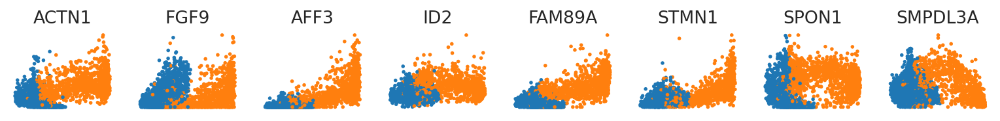

saving figure to file ./figures/scvelo_tsp2_row3.pdf


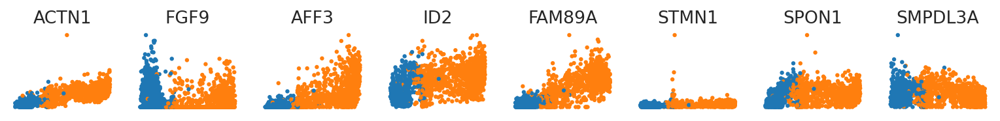

In [80]:
scv.pl.scatter(tsp1Myo, x='latent_time', y=genes12.gene.tolist()[:8], frameon=False, color='manual_cell_ontology_class', ncols=8, save='tsp1_row1')
scv.pl.scatter(tsp2Myo, x='latent_time', y=genes12.gene.tolist()[:8], frameon=False, color='manual_cell_ontology_class', ncols=8, save='tsp2_row1')

scv.pl.scatter(tsp1Myo, x='latent_time', y=genes12.gene.tolist()[16:24], frameon=False, color='manual_cell_ontology_class', ncols=8, save='tsp1_row2')
scv.pl.scatter(tsp2Myo, x='latent_time', y=genes12.gene.tolist()[16:24], frameon=False, color='manual_cell_ontology_class', ncols=8, save='tsp2_row2')

scv.pl.scatter(tsp1Myo, x='latent_time', y=genes12.gene.tolist()[24:32], frameon=False, color='manual_cell_ontology_class', ncols=8, save='tsp1_row3')
scv.pl.scatter(tsp2Myo, x='latent_time', y=genes12.gene.tolist()[24:32], frameon=False, color='manual_cell_ontology_class', ncols=8, save='tsp2_row3')


saving figure to file ./figures/scvelo_tsp1_row1_mylk.pdf


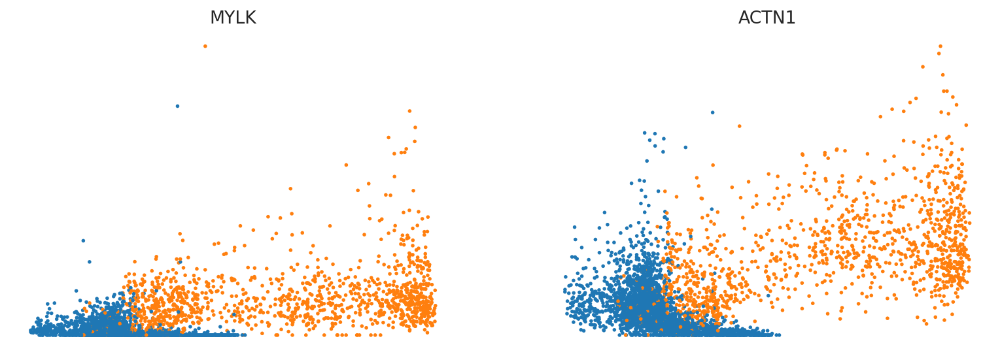

saving figure to file ./figures/scvelo_tsp2_row1_mylk.pdf


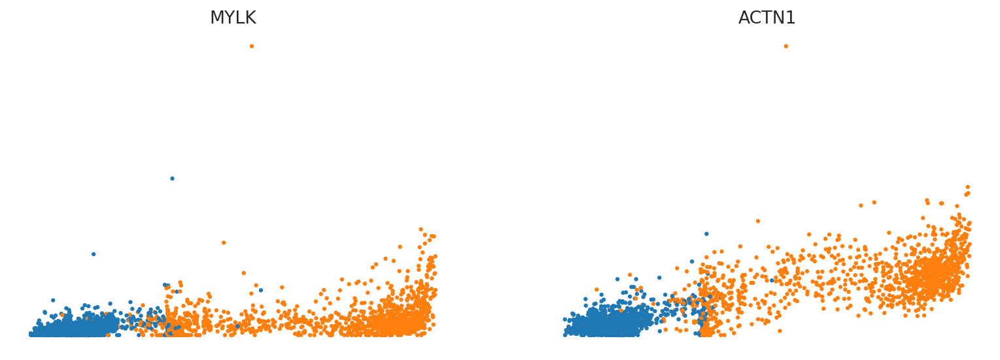

In [90]:
scv.pl.scatter(tsp1Myo, x='latent_time', y=['MYLK','ACTN1'], frameon=False, color='manual_cell_ontology_class', ncols=2, save='tsp1_row1_mylk')
scv.pl.scatter(tsp2Myo, x='latent_time', y=['MYLK','ACTN1'], frameon=False, color='manual_cell_ontology_class', ncols=2, save='tsp2_row1_mylk')


#### Visualizing cell cycle in Macrophages

Trying to set attribute `.obs` of view, copying.


filtered out 38273 genes that are detected in less than 20 cells
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:01)
computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:01)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)


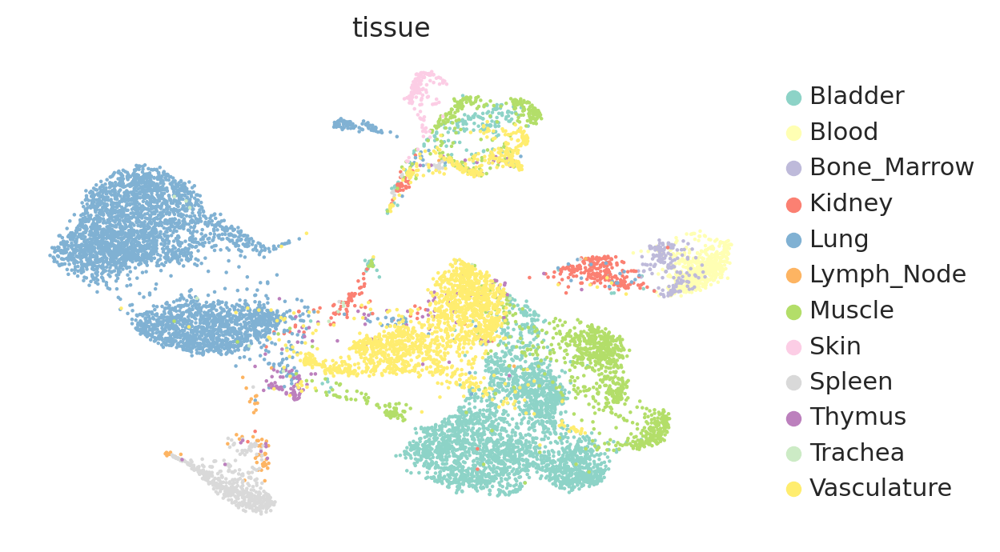

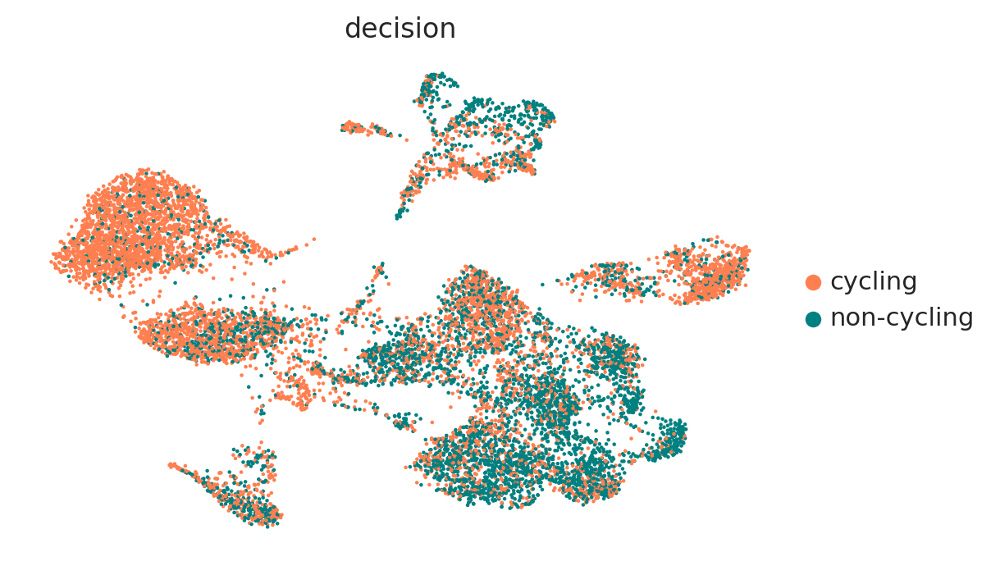

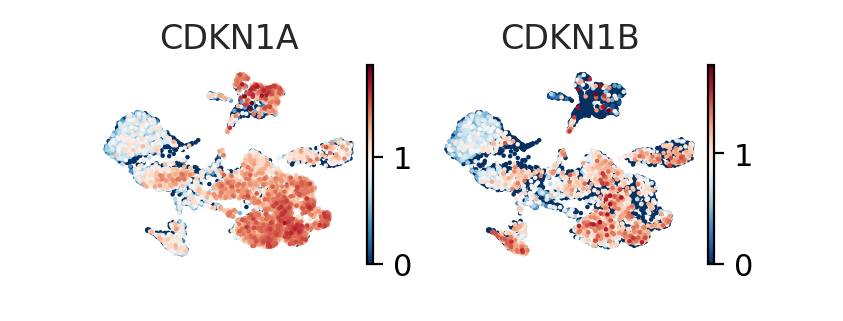

In [20]:
col = 'cell_ontology_class'

celltype = alldons[alldons.obs[col].isin(['macrophage']) & (alldons.obs['donor']=='TSP2')]
sc.pp.filter_cells(celltype, min_genes=200)
sc.pp.filter_genes(celltype, min_cells=20)
sc.pp.log1p(celltype)
celltype.raw = celltype

del celltype.obsp
del celltype.obsm
del celltype.uns
scv.pp.filter_genes_dispersion(celltype, n_top_genes=2000)

sc.pp.neighbors(celltype)
sc.tl.pca(celltype, svd_solver='arpack')
sc.tl.umap(celltype)
sc.pl.umap(celltype, color ='tissue',frameon=False, palette='Set3', save='macrophages_tsp2.pdf')
sc.pl.umap(celltype, color ='decision',frameon=False, palette =['coral','teal'], save='macrophages_tsp2_ccindex.pdf')
g0 = ['CDKN1A', 'CDKN1B']
sc.pl.umap(celltype, color =g0, title = g0, frameon=False, save='macrophages_tsp2_cdks.pdf')


#### macrophage cycling index

Trying to set attribute `.obs` of view, copying.


filtered out 38273 genes that are detected in less than 20 cells
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:01)


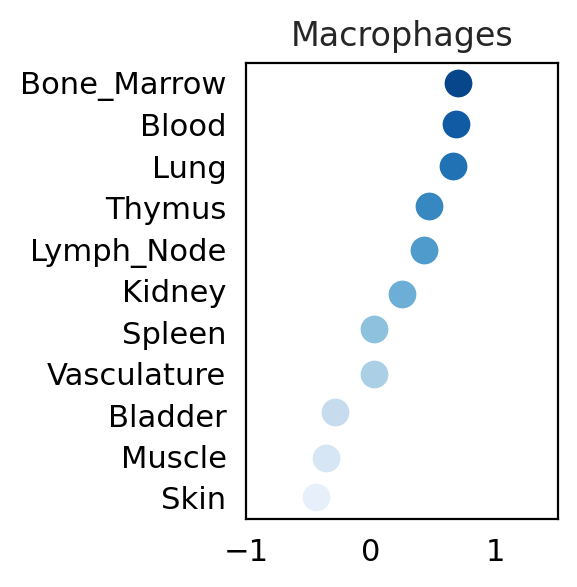

In [24]:
column = 'tissue'
#extracting cell types that have at least 100 observations 
celltype = alldons[alldons.obs[col].isin(['macrophage']) & (alldons.obs['donor']=='TSP2')]
sc.pp.filter_cells(celltype, min_genes=200)
sc.pp.filter_genes(celltype, min_cells=20)
celltype.raw = celltype
scv.pp.filter_genes_dispersion(celltype, n_top_genes=2000)


dataCyc10 = celltype[(celltype.obs['decision']!='not clear')]


dataCyc10_tsp1 = dataCyc10[dataCyc10.obs['cell_ontology_class']=='macrophage']

grouped_tsp1=celltype.obs.groupby([column]).count()

grouped_tsp1 = grouped_tsp1[grouped_tsp1['decision']>20]

#list of cell types that pass the filters
grouped3list_tsp1=grouped_tsp1.index.tolist() 

#reducing dataCyc10 by cell types that have 100 observations (inlcuded in grouped3list)
dataCyc10_fil_tsp1 = dataCyc10_tsp1[dataCyc10_tsp1.obs[column].isin(grouped3list_tsp1)]

if dataCyc10_fil_tsp1.shape[0] > 20 :
    dataCyc10_fil_df_tsp1=dataCyc10_fil_tsp1.obs.groupby([column, 'decision']).count().unstack()['cycling']
    
    #I had to add this line 
    dataCyc10_fil_df_tsp1.columns = dataCyc10_fil_df_tsp1.columns.astype(str)

    #ratio of cycling to non-cycling cells
    dataCyc10_fil_df_tsp1['ratio']= dataCyc10_fil_df_tsp1['cycling']/dataCyc10_fil_df_tsp1['non-cycling']

    #sorting the ratios (ratio of cycling to non)
    dataCyc10_fil_sorted_df_tsp1 = np.log10(dataCyc10_fil_df_tsp1)

    dataCyc10_fil_sorted_df_tsp1 = dataCyc10_fil_sorted_df_tsp1.sort_values(by ='ratio', ascending=False)

    dataCyc10_fil_sorted_df_tsp1 = dataCyc10_fil_sorted_df_tsp1.reset_index()

    plt.figure(figsize=[2,3])
    plt.title('Macrophages')
    plt.xlim(-1, 1.5)
    ax = sns.stripplot(x="ratio", y=column, order=dataCyc10_fil_sorted_df_tsp1[column], 
                       data=dataCyc10_fil_sorted_df_tsp1, size=10, palette='Blues_r')


    plt.xlabel('')
    plt.ylabel('')
    plt.savefig(mainDir + 'images/macrophages_ccindex_across_tissues.pdf', bbox_inches='tight')




#### Cell cycle in intestinal tissue 

Trying to set attribute `.obs` of view, copying.


filtered out 20334 genes that are detected in less than 20 cells
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:03)


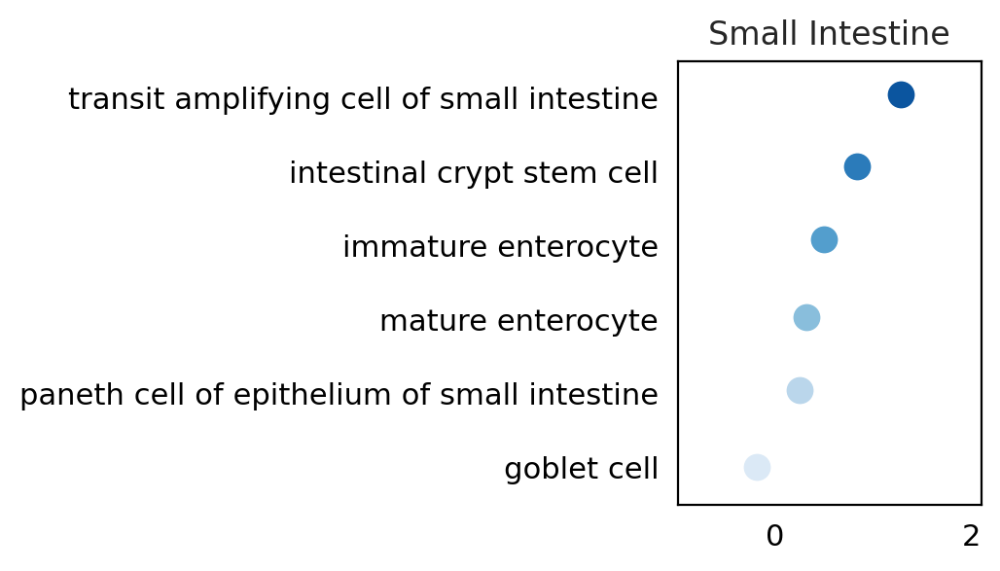

In [41]:
column = 'cell_ontology_class'
celltype = alldons[(alldons.obs['donor']=='TSP2')]
sc.pp.filter_cells(celltype, min_genes=200)
sc.pp.filter_genes(celltype, min_cells=20)
celltype.raw = celltype
scv.pp.filter_genes_dispersion(celltype, n_top_genes=2000)

dataCyc10 = celltype[(celltype.obs['decision']!='not clear') & 
                          (celltype.obs['computational_compartment_assignment']!='Immune') &
                    (~celltype.obs[column].str.contains('b cell|cd8-positive', case=False))]

dataCyc10_tsp1 = dataCyc10[dataCyc10.obs.tissue=='Small_Intestine']


grouped_tsp1=dataCyc10_tsp1.obs.groupby([column]).count()

grouped_tsp1 = grouped_tsp1[grouped_tsp1['decision']>50]

#list of cell types that pass the filters
grouped3list_tsp1=grouped_tsp1.index.tolist() 

#reducing dataCyc10 by cell types that have 20 observations (inlcuded in grouped3list)
dataCyc10_fil_tsp1 = dataCyc10_tsp1[dataCyc10_tsp1.obs[column].isin(grouped3list_tsp1)]

if dataCyc10_fil_tsp1.shape[0] > 20 :
    dataCyc10_fil_df_tsp1=dataCyc10_fil_tsp1.obs.groupby([column, 'decision']).count().unstack()['cycling']
    
    #I had to add this line 
    dataCyc10_fil_df_tsp1.columns = dataCyc10_fil_df_tsp1.columns.astype(str)

    #ratio of cycling to non-cycling cells
    dataCyc10_fil_df_tsp1['ratio']= dataCyc10_fil_df_tsp1['cycling']/dataCyc10_fil_df_tsp1['non-cycling']

    #sorting the ratios (ratio of cycling to non)
    dataCyc10_fil_sorted_df_tsp1 = np.log10(dataCyc10_fil_df_tsp1)

    dataCyc10_fil_sorted_df_tsp1 = dataCyc10_fil_sorted_df_tsp1.sort_values(by ='ratio', ascending=False)

    dataCyc10_fil_sorted_df_tsp1 = dataCyc10_fil_sorted_df_tsp1.reset_index()

    plt.figure(figsize=[2,3])
    plt.title('Small Intestine')
    plt.xlim(-1, 2.1)
    ax = sns.stripplot(x="ratio", y=column, order=dataCyc10_fil_sorted_df_tsp1[column], 
                       data=dataCyc10_fil_sorted_df_tsp1, size=10, palette='Blues_r')


    plt.xlabel('')
    plt.ylabel('')
    plt.savefig(mainDir + 'images/small_intestine_ccindex.pdf', bbox_inches='tight')



Trying to set attribute `.obs` of view, copying.


filtered out 20334 genes that are detected in less than 20 cells
computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:00)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing PCA
    on highly variable genes
    with n_comps=16
    finished (0:00:00)
running Leiden clustering
    finished: found 3 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:00)


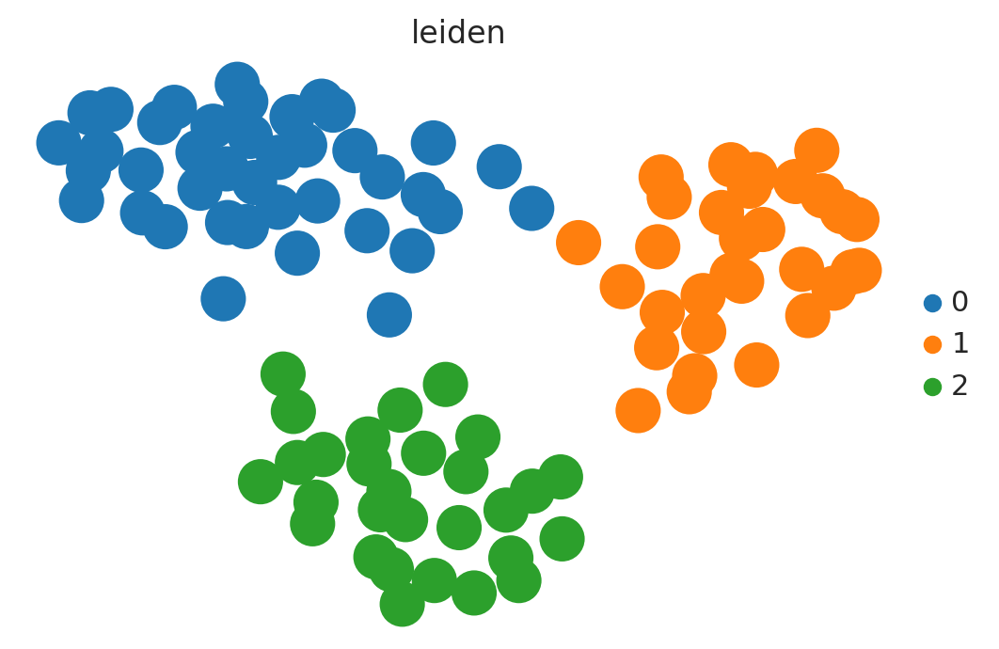

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


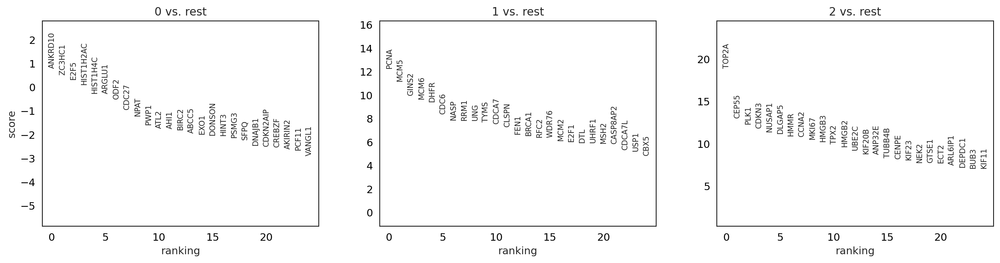

In [103]:
#reading the list of marker genes
tabula2= pd.read_csv(mainDir + 'tabula2.csv')
#Removing the double occurance of TOP2A as both a G2/M and G2 marker
tabula2 = tabula2[~((tabula2.gene=='TOP2A') & (tabula2.assignedPhase=='G2'))]

column = 'cell_ontology_class'
celltype = alldons[(alldons.obs['donor']=='TSP2')]
sc.pp.filter_cells(celltype, min_genes=200)
sc.pp.filter_genes(celltype, min_cells=20)
sc.pp.log1p(celltype)

celltype.raw = celltype

genes=[gene for gene in tabula2.gene.tolist() if gene in celltype.var['gene_symbol']]
col2='cell_ontology_class'
celltype_m=celltype[:, genes]
celllst = ['transit amplifying cell of small intestine']
subset=celltype_m[(celltype_m.obs[col2].isin(celllst))]

del subset.obsp
del subset.obsm
del subset.uns

del subset.raw
sc.pp.neighbors(subset)
sc.tl.pca(subset, svd_solver='arpack')


sc.tl.leiden(subset, resolution =.4)
sc.tl.umap(subset,spread=.7)
sc.pl.umap(subset, color=['leiden'], frameon=False, save='transient_amplifying_cells_small_intes_tsp2.pdf')

sc.tl.rank_genes_groups(subset, 'leiden', method='t-test')
sc.pl.rank_genes_groups(subset, n_genes=25, sharey=False)


In [106]:
print(tabula2[tabula2.gene=='PCNA'])
print(tabula2[tabula2.gene=='TOP2A'])
print(tabula2[tabula2.gene=='E2F5'])
print(tabula2[tabula2.gene=='ZC3HC1'])


    Unnamed: 0  Unnamed: 0.1  gene assignedPhase             source
18          18            18  PCNA          G1/S  Tabula Sapiens v2
    Unnamed: 0  Unnamed: 0.1   gene assignedPhase             source
93          93            93  TOP2A          G2/M  Tabula Sapiens v2
     Unnamed: 0  Unnamed: 0.1  gene assignedPhase             source
125         125           125  E2F5             M  Tabula Sapiens v2
     Unnamed: 0  Unnamed: 0.1    gene assignedPhase             source
116         116           116  ZC3HC1             M  Tabula Sapiens v2
